In [1]:
import datetime
from datetime import date
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from sklearn.preprocessing import StandardScaler
import missingno as msno
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from mpl_toolkits.mplot3d import Axes3D
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.mixture import GaussianMixture
from sklearn.cluster import SpectralClustering 

In [2]:
data_path="C:\\Users\\semih\\Desktop\\tez\\marketing_campaign.csv"



In [3]:
data=pd.read_csv(data_path, sep="\t")

In [4]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [5]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [6]:
data.shape

(2240, 29)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.251354,25173.076661,1730.0,35303.00,51381.5,68522.00,666666.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0


In [9]:
data.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [10]:
null_values = ['GG', 'NA', '?', '-','X']

In [11]:
for column in data.columns:
    count = data[column].isin(null_values).sum()
    print(f"{column}  {count}")

ID  0
Year_Birth  0
Education  0
Marital_Status  0
Income  0
Kidhome  0
Teenhome  0
Dt_Customer  0
Recency  0
MntWines  0
MntFruits  0
MntMeatProducts  0
MntFishProducts  0
MntSweetProducts  0
MntGoldProds  0
NumDealsPurchases  0
NumWebPurchases  0
NumCatalogPurchases  0
NumStorePurchases  0
NumWebVisitsMonth  0
AcceptedCmp3  0
AcceptedCmp4  0
AcceptedCmp5  0
AcceptedCmp1  0
AcceptedCmp2  0
Complain  0
Z_CostContact  0
Z_Revenue  0
Response  0


In [12]:
data.isna().mean() * 100

ID                     0.000000
Year_Birth             0.000000
Education              0.000000
Marital_Status         0.000000
Income                 1.071429
Kidhome                0.000000
Teenhome               0.000000
Dt_Customer            0.000000
Recency                0.000000
MntWines               0.000000
MntFruits              0.000000
MntMeatProducts        0.000000
MntFishProducts        0.000000
MntSweetProducts       0.000000
MntGoldProds           0.000000
NumDealsPurchases      0.000000
NumWebPurchases        0.000000
NumCatalogPurchases    0.000000
NumStorePurchases      0.000000
NumWebVisitsMonth      0.000000
AcceptedCmp3           0.000000
AcceptedCmp4           0.000000
AcceptedCmp5           0.000000
AcceptedCmp1           0.000000
AcceptedCmp2           0.000000
Complain               0.000000
Z_CostContact          0.000000
Z_Revenue              0.000000
Response               0.000000
dtype: float64

# DATA VISUALIZATION BEFORE PREPROCESS

In [13]:
#MntWines BOX PLOT
fig = px.box(data, x='MntWines', title='MntWines', color_discrete_sequence=["#7A1012"])
#SHOW THE PLOT
fig.show()

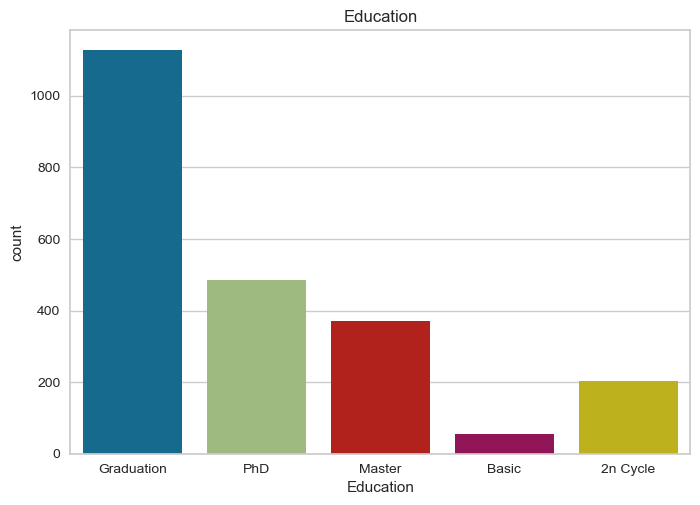

In [14]:
#EDUCATION BAR CHART
sns.countplot(x=data['Education'],data=data)
plt.title('Education')
plt.show()

In [15]:
#MntFruits BOX PLOT
fig = px.box(data, x='MntFruits', title='MntFruits Box Plot', color_discrete_sequence=['#8CB9C0'])
#SHOW THE PLOT
fig.show()

In [16]:
#MntMeatProducts BOX PLOT
fig = px.box(data, x='MntMeatProducts', title='MntMeatProducts Box Plot', color_discrete_sequence=['#EDCA7F'])
#SHOW THE PLOT
fig.show()

In [17]:
#MntFishProducts BOX PLOT
fig = px.box(data, x='MntFishProducts', title='MntFishProducts Box Plot', color_discrete_sequence=['#F282A7'])
#SHOW THE PLOT
fig.show()

In [18]:
#MntSweetProducts BOX PLOT
fig = px.box(data, x='MntSweetProducts', title='MntSweetProducts Box Plot', color_discrete_sequence=['#AD80A2'])
#SHOW THE PLOT
fig.show()

In [19]:
#MntGoldProds BOX PLOT
fig = px.box(data, x='MntGoldProds', title='MntGoldProds Box Plot', color_discrete_sequence=['#5E211C'])
#SHOW THE PLOT
fig.show()

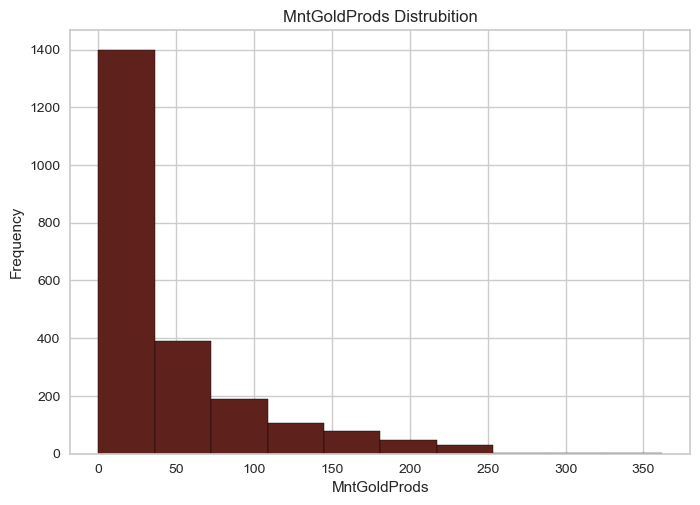

In [20]:
#MntGoldProds HISTOGRAM
plt.hist(data["MntGoldProds"], color=["#5E211C"], edgecolor='black')
plt.xlabel('MntGoldProds')
plt.ylabel('Frequency')
plt.title('MntGoldProds Distrubition')
plt.show()

In [21]:
#YEAR BIRTH BOX PLOT
fig = px.box(data, x='Year_Birth', title='Year Birth Box Plot', color_discrete_sequence=['#FF5733'])
#SHOW THE PLOT
fig.show()

In [22]:
#Income BOX PLOT
fig = px.box(data, x='Income', title='Income Box Plot', color_discrete_sequence=["#012647"])
#SHOW THE PLOT
fig.show()

In [23]:
#ACCEPTED COMPANY1 DISTRIBUTION
cmp1_counts = data["AcceptedCmp1"].value_counts()
#CREATE A NEW DATA FRAME CONTAINING NUMBERS
cmp1_counts_df = pd.DataFrame({
    'AcceptedCmp1 Level': cmp1_counts.index,
    'Count': cmp1_counts.values})
#CREATE PIE CHART
fig = px.pie(cmp1_counts_df, names='AcceptedCmp1 Level', values='Count', title='AcceptedCmp1 Level Distribution')
#SHOW THE PLOT
fig.show()

In [24]:
#ACCEPTED COMPANY2 DISTRIBUTION
cmp2_counts = data["AcceptedCmp2"].value_counts()
#CREATE A NEW DATA FRAME CONTAINING NUMBERS
cmp2_counts_df = pd.DataFrame({
    'AcceptedCmp2 Level': cmp2_counts.index,
    'Count': cmp2_counts.values})
#CREATE PIE CHART
fig = px.pie(cmp2_counts_df, names='AcceptedCmp2 Level', values='Count', title='AcceptedCmp2 Level Distribution')
#SHOW THE PLOT
fig.show()

In [25]:
#ACCEPTED COMPANY3 DISTRIBUTION
cmp3_counts = data["AcceptedCmp3"].value_counts()
#CREATE A NEW DATA FRAME CONTAINING NUMBERS
cmp3_counts_df = pd.DataFrame({
    'AcceptedCmp3 Level': cmp3_counts.index,
    'Count': cmp3_counts.values})
#CREATE PIE CHART
fig = px.pie(cmp3_counts_df, names='AcceptedCmp3 Level', values='Count', title='AcceptedCmp3 Level Distribution')
#SHOW THE PLOT
fig.show()

In [26]:
#ACCEPTED COMPANY4 DISTRIBUTION
cmp4_counts = data["AcceptedCmp4"].value_counts()
#CREATE A NEW DATA FRAME CONTAINING NUMBERS
cmp4_counts_df = pd.DataFrame({
    'AcceptedCmp4 Level': cmp4_counts.index,
    'Count': cmp4_counts.values})
#CREATE PIE CHART
fig = px.pie(cmp4_counts_df, names='AcceptedCmp4 Level', values='Count', title='AcceptedCmp4 Level Distribution')
#SHOW THE PLOT
fig.show()

In [27]:
#ACCEPTED COMPANY5 DISTRIBUTION
cmp5_counts = data["AcceptedCmp5"].value_counts()
#CREATE A NEW DATA FRAME CONTAINING NUMBERS
cmp5_counts_df = pd.DataFrame({
    'AcceptedCmp5 Level': cmp5_counts.index,
    'Count': cmp5_counts.values})
#CREATE PIE CHART
fig = px.pie(cmp5_counts_df, names='AcceptedCmp5 Level', values='Count', title='AcceptedCmp5 Level Distribution')
#SHOW THE PLOT
fig.show()

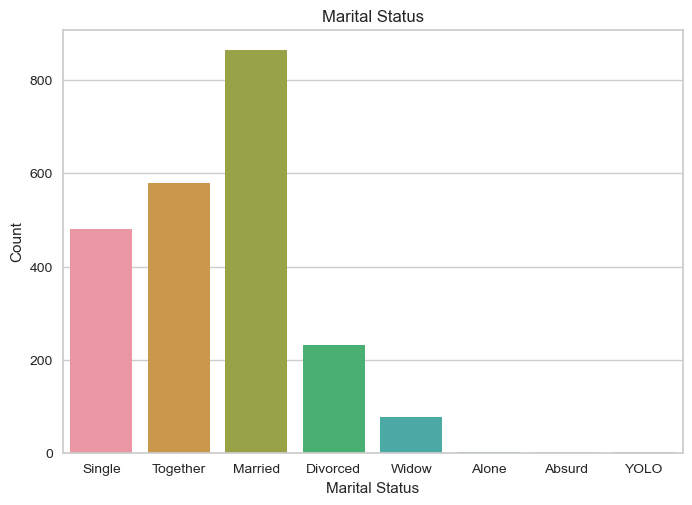

In [28]:
#Marital_Status BAR CHART
sns.countplot(x=data["Marital_Status"],data=data)
plt.xlabel("Marital Status")
plt.ylabel("Count")
plt.title("Marital Status")
plt.show()

In [29]:
#Marital_Status PIE CHART
marital_counts = data["Marital_Status"].value_counts()

#CREATE A NEW DATA FRAME CONTAINING NUMBERS
marital_counts_df = pd.DataFrame({
    'Marital Status Level': marital_counts.index,
    'Count': marital_counts.values
})

#CREATE PIE CHART
fig = px.pie(marital_counts_df, names='Marital Status Level', values='Count', title='Marital Status Level Distribution')

#SHOW THE PLOT
fig.show()

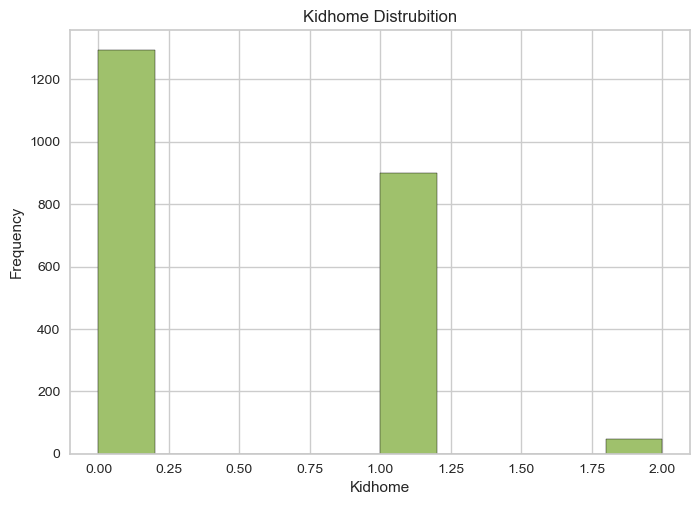

In [30]:
#Kidhome HISTOGRAM
plt.hist(data["Kidhome"], color=["#9fc16c"], edgecolor='black')
plt.xlabel('Kidhome')
plt.ylabel('Frequency')
plt.title('Kidhome Distrubition')
plt.show()

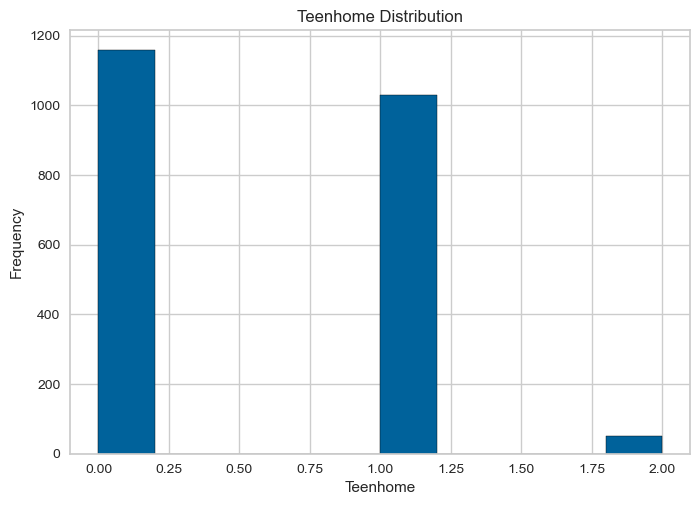

In [31]:
#Teenhome HISTOGRAM
plt.hist(data["Teenhome"], color=["#00629B"], edgecolor='black')
plt.xlabel('Teenhome')
plt.ylabel('Frequency')
plt.title('Teenhome Distribution')
plt.show()

In [32]:
#Recency BOX PLOT
fig=px.box(data, x='Recency', title='Recency Boxplot',color_discrete_sequence=["#31829f"])
#Show the plot
fig.show()

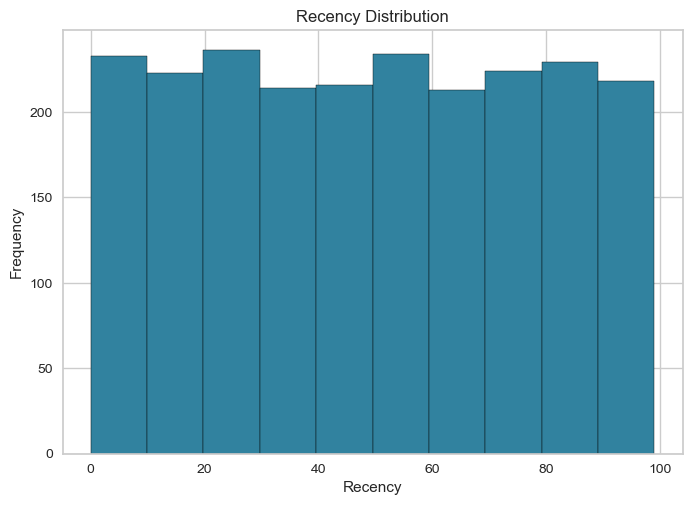

In [33]:
#Recency HISTOGRAM
plt.hist(data["Recency"], color=["#31829F"], edgecolor='black')
plt.xlabel('Recency')
plt.ylabel('Frequency')
plt.title('Recency Distribution')
plt.show()

In [34]:
#Complain PIE CHART
complain_counts = data["Complain"].value_counts()
#CREATE A NEW DATA FRAME CONTAINING NUMBERS
complain_counts_df = pd.DataFrame({
    'Complain Status Level': complain_counts.index,
    'Count': complain_counts.values})
#CREATE PIE CHART
fig = px.pie(complain_counts_df, names='Complain Status Level', values='Count', title='Complain Status Level Distribution')
#SHOW THE PLOT
fig.show()

In [35]:
#NumDealsPurchases BOX PLOT
fig=px.box(data, x='NumDealsPurchases', title='NumDealsPurchases Boxplot', color_discrete_sequence=["#FFC0CB"])
#Show the plot
fig.show()

In [36]:
#Response PIE CHART
response_counts = data["Response"].value_counts()
#CREATE A NEW DATA FRAME CONTAINING NUMBERS
response_counts_df = pd.DataFrame({
    'Response Status Level': response_counts.index,
    'Count': response_counts.values})
#CREATE PIE CHART
fig = px.pie(response_counts_df, names='Response Status Level', values='Count', title='Response Status Level Distribution')
#SHOW THE PLOT
fig.show()

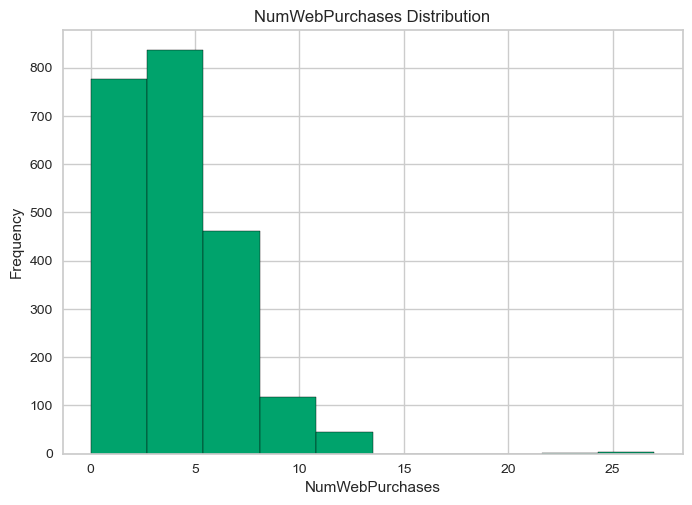

In [37]:
#NumWebPurchases HISTOGRAM
plt.hist(data["NumWebPurchases"], color=["#00A36C"], edgecolor='black')
plt.xlabel('NumWebPurchases')
plt.ylabel('Frequency')
plt.title('NumWebPurchases Distribution')
plt.show()

In [38]:
#NumCatalogPurchases BOX PLOT
fig=px.box(data, x='NumCatalogPurchases', title='NumCatalogPurchases', color_discrete_sequence=["#FFA500"])
#Show the plot
fig.show()

In [39]:
#NumStorePurchases BOX PLOT
fig=px.box(data, x='NumStorePurchases', title='NumStorePurchases', color_discrete_sequence=["#B06500"])
#Show the plot
fig.show()

In [40]:
#NumWebVisitsMonth BOX PLOT
fig=px.box(data, x='NumWebVisitsMonth', title='NumWebVisitsMonth', color_discrete_sequence=["#800080"])
#Show the plot
fig.show()

In [41]:
#Dt_Customer BOX PLOT
fig=px.box(data, x='Dt_Customer', title='Dt_Customer', color_discrete_sequence=["#800085"])
#Show the plot
fig.show()

In [42]:
#Z_CostContact BOX PLOT
fig=px.box(data, x='Z_CostContact', title='Z_CostContact')
#Show the plot
fig.show()

In [43]:
#Z_Revenue BOX PLOT
fig=px.box(data, x='Z_Revenue', title='Z_Revenue')
#Show the plot
fig.show()

# DATA CLEANING

In [44]:
data.head(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [45]:
# Check for and remove duplicated rows
duplicated_rows = data.loc[:,data.columns.difference(["ID"])].duplicated(keep=False)
# Print the duplicated rows (if any)
if duplicated_rows.any():
    display("Duplicated rows:")
    display(data[duplicated_rows].sort_values(by=['Year_Birth'], ascending = False).head(6))
    display(f"Number of Data Duplicated: {duplicated_rows.sum()}")
    # Remove duplicated rows
    data = data.drop_duplicates(subset=data.columns.difference(["ID"]), keep="first")
else:
    display("No duplicated rows.")

'Duplicated rows:'

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
696,8315,1995,Graduation,Single,34824.0,0,0,26-03-2014,65,4,...,6,0,0,0,0,0,0,3,11,0
995,5184,1995,Graduation,Single,34824.0,0,0,26-03-2014,65,4,...,6,0,0,0,0,0,0,3,11,0
392,2669,1993,Graduation,Single,74293.0,0,0,04-05-2014,66,375,...,2,0,0,0,0,0,0,3,11,0
928,10037,1993,Graduation,Single,74293.0,0,0,04-05-2014,66,375,...,2,0,0,0,0,0,0,3,11,0
1578,8175,1992,Graduation,Married,34935.0,0,0,21-06-2013,71,34,...,7,0,0,0,0,0,0,3,11,0
508,3386,1992,Graduation,Married,34935.0,0,0,21-06-2013,71,34,...,7,0,0,0,0,0,0,3,11,0


'Number of Data Duplicated: 358'

In [46]:
#Fill missing values
Q3_value = data['Income'].quantile(0.75)
data['Income'].fillna(Q3_value, inplace=True)

In [47]:
data.head(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [48]:
del data["Z_CostContact"]

In [49]:
del data["Z_Revenue"]

In [50]:
data.head(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,3,6,5,0,0,0,0,0,0,0


In [51]:
#Current Year
current_year = datetime.datetime.now().year

#Create Age Column
data['Age'] = current_year - data['Year_Birth']

In [52]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,4,7,0,0,0,0,0,0,1,67
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,2,5,0,0,0,0,0,0,0,70
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,10,4,0,0,0,0,0,0,0,59
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,4,6,0,0,0,0,0,0,0,40
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,6,5,0,0,0,0,0,0,0,43


In [53]:


data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'], format='%d-%m-%Y')
current_year = pd.Timestamp.now().year
data['Enrollment_Year'] = current_year - data['Dt_Customer'].dt.year

In [54]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Enrollment_Year
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,1,67,12
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,0,70,10
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,0,59,11
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,0,40,10
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,0,43,10


# OUTLIERS

In [55]:
#Age BOX PLOT
fig=px.box(data, x='Age', title='Age')
#Show the plot
fig.show()

In [56]:
#Enrollment_Year BOX PLOT
fig=px.box(data, x='Enrollment_Year', title='Enrollment_Year')
#Show the plot
fig.show()

In [57]:
def replace_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data[column] = data[column].apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))





In [58]:
replace_outliers(data, 'Income')

fig=px.box(data, x='Income', title='Income')
fig.show()

In [59]:
replace_outliers(data, 'Year_Birth')

#Year_Birth BOX PLOT
fig=px.box(data, x='Year_Birth', title='Year_Birth')
#Show the plot
fig.show()


In [60]:
replace_outliers(data, 'MntWines')
fig=px.box(data, x='MntWines', title='MntWines')
fig.show()

In [61]:
replace_outliers(data, 'MntFruits')
fig=px.box(data, x='MntFruits', title='MntFruits')
fig.show()


In [62]:
replace_outliers(data, 'MntMeatProducts')
fig=px.box(data, x='MntMeatProducts', title='MntMeatProducts')
fig.show()


In [63]:
replace_outliers(data, 'MntFishProducts')
fig=px.box(data, x='MntFishProducts', title='MntFishProducts')
fig.show()

In [64]:
replace_outliers(data, 'MntSweetProducts')
fig=px.box(data, x='MntSweetProducts', title='MntSweetProducts')
fig.show()

In [65]:
replace_outliers(data, 'MntGoldProds')
fig=px.box(data, x='MntGoldProds', title='MntGoldProds')
fig.show()

In [66]:
replace_outliers(data, 'NumDealsPurchases')
fig=px.box(data, x='NumDealsPurchases', title='NumDealsPurchases')
fig.show()

In [67]:
replace_outliers(data, 'NumWebPurchases')
fig=px.box(data, x='NumWebPurchases', title='NumWebPurchases')
fig.show()

In [68]:
replace_outliers(data, 'NumCatalogPurchases')
fig=px.box(data, x='NumCatalogPurchases', title='NumCatalogPurchases')
fig.show()

In [69]:
replace_outliers(data, 'NumWebVisitsMonth')
fig=px.box(data, x='NumWebVisitsMonth', title='NumWebVisitsMonth')
fig.show()

In [70]:
replace_outliers(data, 'Age')
fig=px.box(data, x='Age', title='Age')
fig.show()


In [71]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2058 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2058 non-null   int64         
 1   Year_Birth           2058 non-null   float64       
 2   Education            2058 non-null   object        
 3   Marital_Status       2058 non-null   object        
 4   Income               2058 non-null   float64       
 5   Kidhome              2058 non-null   int64         
 6   Teenhome             2058 non-null   int64         
 7   Dt_Customer          2058 non-null   datetime64[ns]
 8   Recency              2058 non-null   int64         
 9   MntWines             2058 non-null   float64       
 10  MntFruits            2058 non-null   float64       
 11  MntMeatProducts      2058 non-null   float64       
 12  MntFishProducts      2058 non-null   float64       
 13  MntSweetProducts     2058 non-null   f

In [72]:
# Create Dummy Values
dummy_education = pd.get_dummies(data['Education'], prefix='Edu')
dummy_marital_status = pd.get_dummies(data['Marital_Status'], prefix='Marital')

data = pd.concat([data, dummy_education, dummy_marital_status], axis=1)

print(data)

         ID  Year_Birth   Education Marital_Status     Income  Kidhome  \
0      5524      1957.0  Graduation         Single   58138.00        0   
1      2174      1954.0  Graduation         Single   46344.00        1   
2      4141      1965.0  Graduation       Together   71613.00        0   
3      6182      1984.0  Graduation       Together   26646.00        1   
4      5324      1981.0         PhD        Married   58293.00        1   
...     ...         ...         ...            ...        ...      ...   
2233   9432      1977.0  Graduation       Together  117649.25        1   
2235  10870      1967.0  Graduation        Married   61223.00        0   
2237   7270      1981.0  Graduation       Divorced   56981.00        0   
2238   8235      1956.0      Master       Together   69245.00        0   
2239   9405      1954.0         PhD        Married   52869.00        1   

      Teenhome Dt_Customer  Recency  MntWines  ...  Edu_Master  Edu_PhD  \
0            0  2012-09-04       58 

In [73]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Enrollment_Year',
       'Edu_2n Cycle', 'Edu_Basic', 'Edu_Graduation', 'Edu_Master', 'Edu_PhD',
       'Marital_Absurd', 'Marital_Alone', 'Marital_Divorced',
       'Marital_Married', 'Marital_Single', 'Marital_Together',
       'Marital_Widow', 'Marital_YOLO'],
      dtype='object')

# NORMALIZATION

In [74]:

normalization_columns = ['Income', 'MntWines','MntFruits','MntMeatProducts','MntFishProducts',
                         'MntSweetProducts','MntGoldProds','NumWebPurchases','NumCatalogPurchases','NumStorePurchases',
                         'NumWebVisitsMonth','NumDealsPurchases','Recency','Enrollment_Year']


scaler = StandardScaler()

data[normalization_columns] = scaler.fit_transform(data[normalization_columns])

data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Edu_Master,Edu_PhD,Marital_Absurd,Marital_Alone,Marital_Divorced,Marital_Married,Marital_Single,Marital_Together,Marital_Widow,Marital_YOLO
0,5524,1957.0,Graduation,Single,0.285248,0,0,2012-09-04,0.312088,1.004720,...,False,False,False,False,False,False,True,False,False,False
1,2174,1954.0,Graduation,Single,-0.275801,1,1,2014-03-08,-0.377754,-0.879122,...,False,False,False,False,False,False,True,False,False,False
2,4141,1965.0,Graduation,Together,0.926263,0,0,2013-08-21,-0.791659,0.373754,...,False,False,False,False,False,False,False,True,False,False
3,6182,1984.0,Graduation,Together,-1.212850,1,0,2014-02-10,-0.791659,-0.879122,...,False,False,False,False,False,False,False,True,False,False
4,5324,1981.0,PhD,Married,0.292621,1,0,2014-01-19,1.553804,-0.390047,...,False,True,False,False,False,True,False,False,False,False


In [75]:
data =data.replace({True:1,False:0})

In [76]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Edu_Master,Edu_PhD,Marital_Absurd,Marital_Alone,Marital_Divorced,Marital_Married,Marital_Single,Marital_Together,Marital_Widow,Marital_YOLO
0,5524,1957.0,Graduation,Single,0.285248,0,0,2012-09-04,0.312088,1.004720,...,0,0,0,0,0,0,1,0,0,0
1,2174,1954.0,Graduation,Single,-0.275801,1,1,2014-03-08,-0.377754,-0.879122,...,0,0,0,0,0,0,1,0,0,0
2,4141,1965.0,Graduation,Together,0.926263,0,0,2013-08-21,-0.791659,0.373754,...,0,0,0,0,0,0,0,1,0,0
3,6182,1984.0,Graduation,Together,-1.212850,1,0,2014-02-10,-0.791659,-0.879122,...,0,0,0,0,0,0,0,1,0,0
4,5324,1981.0,PhD,Married,0.292621,1,0,2014-01-19,1.553804,-0.390047,...,0,1,0,0,0,1,0,0,0,0


In [77]:
preprocessed_columns=['Income','MntWines','MntFruits','MntMeatProducts','MntFishProducts',
                      'MntSweetProducts','MntGoldProds','NumWebPurchases','NumCatalogPurchases',
                      'NumStorePurchases','NumWebVisitsMonth','NumDealsPurchases','Recency','Enrollment_Year',
                      'Kidhome','Teenhome', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 
                    'AcceptedCmp2', 'Complain', 'Response', 'Edu_2n Cycle', 'Edu_Basic','Edu_Graduation',
                      'Edu_Master','Edu_PhD','Marital_Absurd','Marital_Alone','Marital_Divorced','Marital_Married',
                      'Marital_Single','Marital_Together','Marital_Widow', 'Marital_YOLO'] 
preprocessed_data = data[preprocessed_columns] 

# K-MEANS Preprocessed Data

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

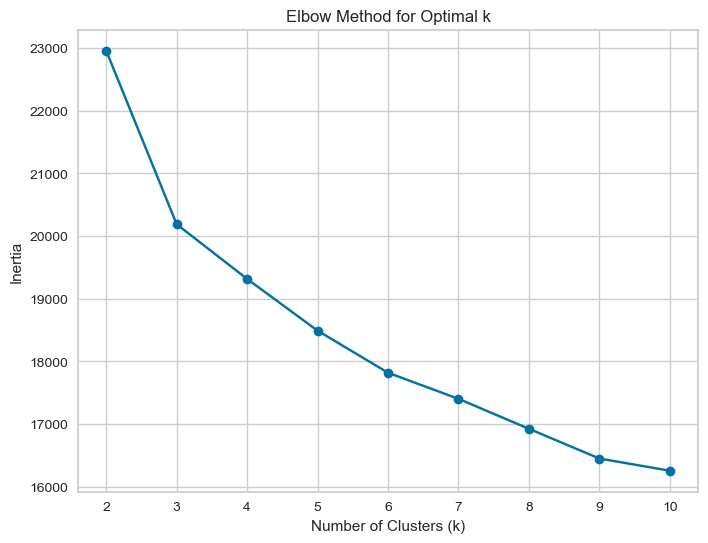

In [78]:
inertia_values = []

for k in range(2,11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=77, n_init='auto')
    kmeans.fit(preprocessed_data)
    inertia_values.append(kmeans.inertia_)

plt.figure(figsize=(8, 6))
plt.plot(range(2,11), inertia_values, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()


In [79]:
kmeans = KMeans(n_clusters=3) 
kmeans.fit(preprocessed_data) 
preprocessed_data['kmeans_labels'] = kmeans.labels_

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



In [80]:
silhouette_score = metrics.silhouette_score(preprocessed_data,preprocessed_data['kmeans_labels']) 
calinski_harabasz_score=metrics.calinski_harabasz_score(preprocessed_data,preprocessed_data['kmeans_labels']) 
davies_bouldin_index=metrics.davies_bouldin_score(preprocessed_data,preprocessed_data['kmeans_labels']) 
print(f"Silhouette Score: {silhouette_score}") 
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}") 
print(f"Davies-Bouldin Index: {davies_bouldin_index}") 

Silhouette Score: 0.2322793084174274
Calinski-Harabasz Index: 765.730091452738
Davies-Bouldin Index: 1.7298993573592867


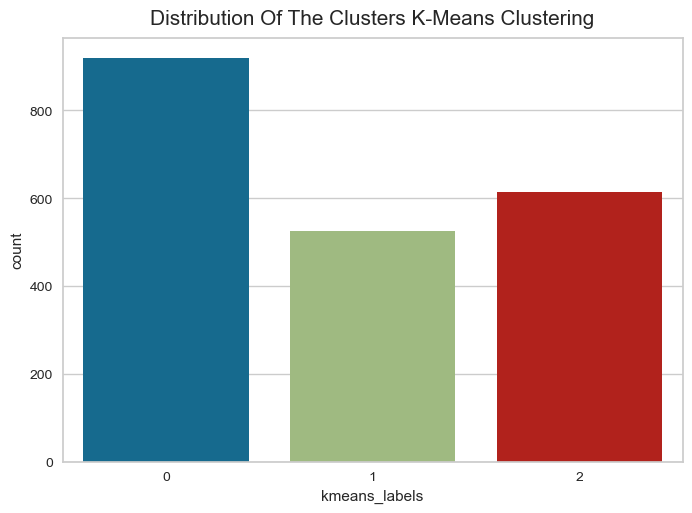

In [81]:
pl = sns.countplot(x=preprocessed_data['kmeans_labels'])
pl.set_title("Distribution Of The Clusters K-Means Clustering", pad=10, size = 15)
plt.show()

# HIERARCHICAL CLUSTERING Preprocessed Data

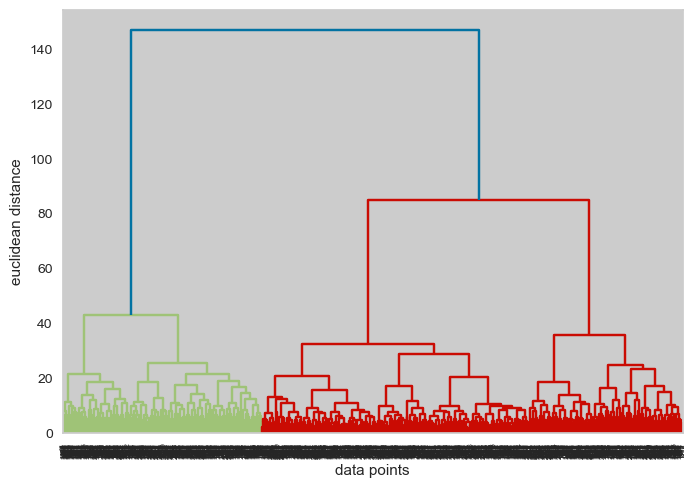

In [82]:
merg=linkage(preprocessed_data,method="ward") 
dendrogram(merg,leaf_rotation=90) 
plt.xlabel("data points") 
plt.ylabel("euclidean distance") 
plt.show() 

In [83]:
hierarchical_cluster=AgglomerativeClustering(n_clusters=2,metric="euclidean",linkage="ward") 
cluster=hierarchical_cluster.fit_predict(preprocessed_data) 
h_labels = hierarchical_cluster.labels_ 
preprocessed_data['hierarchical_labels'] =h_labels

In [84]:
silhouette_score = metrics.silhouette_score(preprocessed_data, h_labels) 
calinski_harabasz_score= metrics.calinski_harabasz_score(preprocessed_data,  h_labels) 
davies_bouldin_index = metrics.davies_bouldin_score(preprocessed_data, h_labels) 
print(f"Silhouette Score: {silhouette_score}") 
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}") 
print(f"Davies-Bouldin Index: {davies_bouldin_index}") 

Silhouette Score: 0.3135924504886173
Calinski-Harabasz Index: 946.9600747400254
Davies-Bouldin Index: 1.3737477185873077


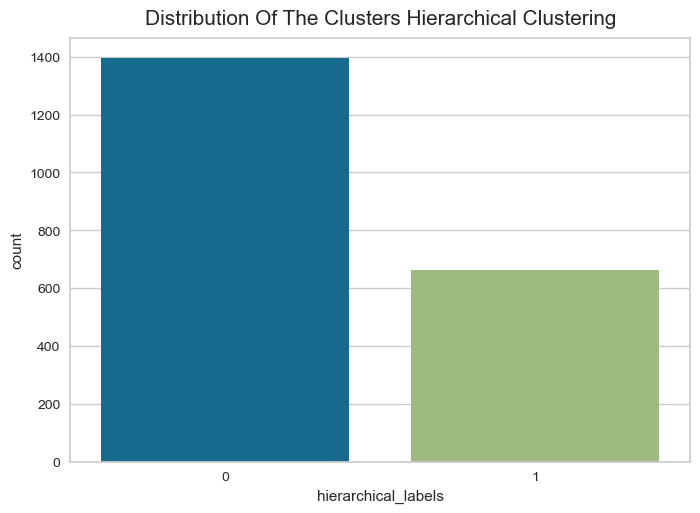

In [85]:
pl = sns.countplot(x=preprocessed_data['hierarchical_labels'])
pl.set_title("Distribution Of The Clusters Hierarchical Clustering", pad=10, size = 15)
plt.show()

# GMM Preprocessed Data

In [86]:
gmm = GaussianMixture(n_components=3) 
gmm.fit(preprocessed_data) 
gmm_labels = gmm.predict(preprocessed_data) 
preprocessed_data["gmm_cluster_labels"]=gmm_labels

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



In [87]:
silhouette_score = metrics.silhouette_score(preprocessed_data, gmm_labels) 
calinski_harabasz_score=metrics.calinski_harabasz_score(preprocessed_data, gmm_labels) 
davies_bouldin_index = metrics.davies_bouldin_score(preprocessed_data, gmm_labels) 
print(f"Silhouette Score: {silhouette_score}") 
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}") 
print(f"Davies-Bouldin Index: {davies_bouldin_index}") 

Silhouette Score: 0.27132089359884776
Calinski-Harabasz Index: 850.3919535501321
Davies-Bouldin Index: 1.6011897829490245


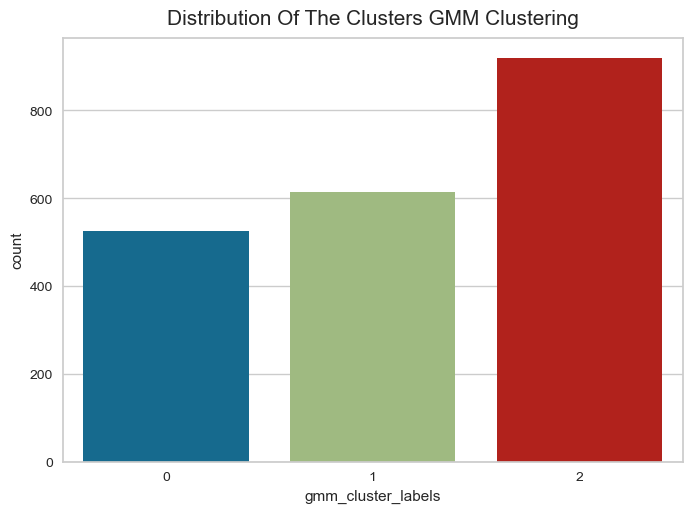

In [88]:
pl = sns.countplot(x=preprocessed_data['gmm_cluster_labels'])
pl.set_title("Distribution Of The Clusters GMM Clustering", pad=10, size = 15)
plt.show()

# SPECTRAL CLUSTERING Preprocessed Data

In [89]:
spectral_model = SpectralClustering(n_clusters = 2, affinity ='nearest_neighbors') 
spectral_label = spectral_model.fit_predict(preprocessed_data) 
preprocessed_data["spectral_labels"]=spectral_label

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



In [90]:
silhouette_score = metrics.silhouette_score(preprocessed_data,preprocessed_data['spectral_labels']) 
calinski_harabasz_score=metrics.calinski_harabasz_score(preprocessed_data, preprocessed_data['spectral_labels']) 
davies_bouldin_index=metrics.davies_bouldin_score(preprocessed_data, preprocessed_data['spectral_labels']) 
print(f"Silhouette Score: {silhouette_score}") 
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}") 
print(f"Davies-Bouldin Index: {davies_bouldin_index}") 

Silhouette Score: 0.2946051352751675
Calinski-Harabasz Index: 1012.6019392939248
Davies-Bouldin Index: 1.3225220429562754


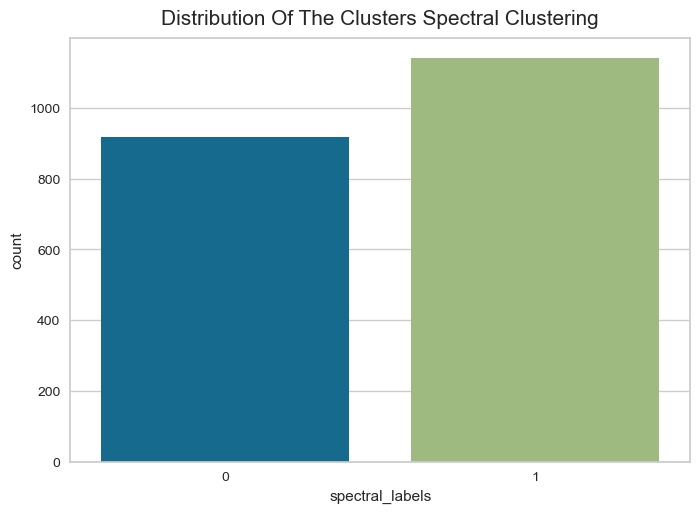

In [91]:
pl = sns.countplot(x=preprocessed_data['spectral_labels'])
pl.set_title("Distribution Of The Clusters Spectral Clustering", pad=10, size = 15)
plt.show()

# CORRELATION MATRIX

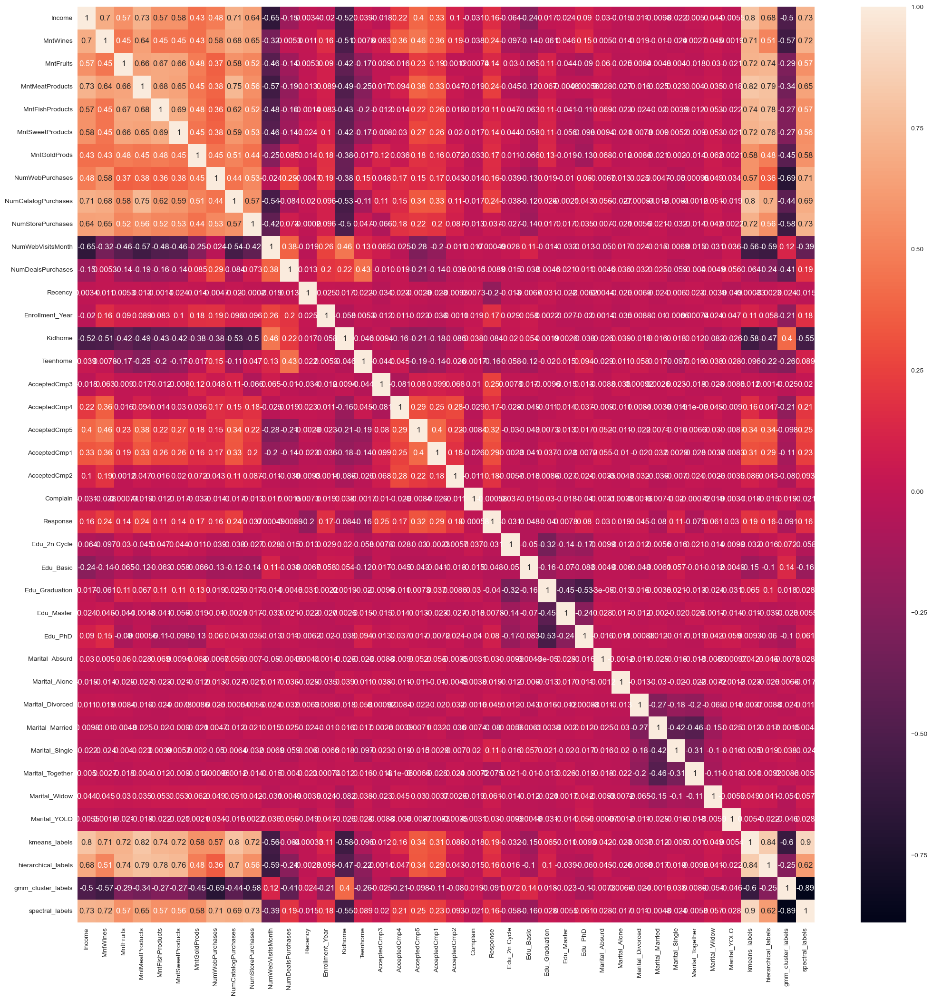

In [92]:
plt.figure(figsize=(25,25))
sns.heatmap(preprocessed_data.corr(), annot=True)
plt.show()

In [93]:
drop_columns=['ID','Recency','Complain','Year_Birth']
data.drop(columns=drop_columns,inplace=True)
data.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,Edu_Master,Edu_PhD,Marital_Absurd,Marital_Alone,Marital_Divorced,Marital_Married,Marital_Single,Marital_Together,Marital_Widow,Marital_YOLO
0,Graduation,Single,0.285248,0,0,2012-09-04,1.004720,2.185418,2.216715,2.200534,...,0,0,0,0,0,0,1,0,0,0
1,Graduation,Single,-0.275801,1,1,2014-03-08,-0.879122,-0.758103,-0.809548,-0.742381,...,0,0,0,0,0,0,1,0,0,0
2,Graduation,Together,0.926263,0,0,2013-08-21,0.373754,1.008009,-0.131441,1.964604,...,0,0,0,0,0,0,0,1,0,0
3,Graduation,Together,-1.212850,1,0,2014-02-10,-0.879122,-0.647721,-0.731089,-0.543703,...,0,0,0,0,0,0,0,1,0,0
4,PhD,Married,0.292621,1,0,2014-01-19,-0.390047,0.787245,-0.181879,0.350347,...,0,1,0,0,0,1,0,0,0,0


In [94]:
#Discretization
# Function to categorize age into groups
def categorize_age(age):
    if age <= 12:
        return 'Child'
    elif age <= 18:
        return 'Young'
    elif age <= 35:
        return 'Young Adult'
    elif age <= 55:
        return 'Middle-Aged'
    else:
        return 'Elderly'

# Applying the categorize_age function to create 'Age Group' column
data['Age_Group'] = data['Age'].apply(categorize_age)

print(data)

       Education Marital_Status    Income  Kidhome  Teenhome Dt_Customer  \
0     Graduation         Single  0.285248        0         0  2012-09-04   
1     Graduation         Single -0.275801        1         1  2014-03-08   
2     Graduation       Together  0.926263        0         0  2013-08-21   
3     Graduation       Together -1.212850        1         0  2014-02-10   
4            PhD        Married  0.292621        1         0  2014-01-19   
...          ...            ...       ...      ...       ...         ...   
2233  Graduation       Together  3.116242        1         0  2013-06-02   
2235  Graduation        Married  0.432004        0         1  2013-06-13   
2237  Graduation       Divorced  0.230208        0         0  2014-01-25   
2238      Master       Together  0.813616        0         1  2014-01-24   
2239         PhD        Married  0.034598        1         1  2012-10-15   

      MntWines  MntFruits  MntMeatProducts  MntFishProducts  ...  Edu_PhD  \
0     1.00

In [95]:
#Concept Hierarchy Generation
data['Marital_Status'] = data['Marital_Status'].replace(['Divorced','Widow','Absurd','Alone','YOLO'],'Single')
data['Education'] = data['Education'].replace(['Graduation', 'Master', 'PhD'], 'Higher_Education')
data['Education'] = data['Education'].replace(['Basic'],'Basic_Education')
data['Education'] = data['Education'].replace(['2nd Cycle'], 'Secondary_Education')
print(data)

             Education Marital_Status    Income  Kidhome  Teenhome  \
0     Higher_Education         Single  0.285248        0         0   
1     Higher_Education         Single -0.275801        1         1   
2     Higher_Education       Together  0.926263        0         0   
3     Higher_Education       Together -1.212850        1         0   
4     Higher_Education        Married  0.292621        1         0   
...                ...            ...       ...      ...       ...   
2233  Higher_Education       Together  3.116242        1         0   
2235  Higher_Education        Married  0.432004        0         1   
2237  Higher_Education         Single  0.230208        0         0   
2238  Higher_Education       Together  0.813616        0         1   
2239  Higher_Education        Married  0.034598        1         1   

     Dt_Customer  MntWines  MntFruits  MntMeatProducts  MntFishProducts  ...  \
0     2012-09-04  1.004720   2.185418         2.216715         2.200534  ...   

In [96]:
#Generalization
data['Children']=data['Kidhome']+data['Teenhome']

In [97]:
data['AcceptedCmp'] = data['AcceptedCmp1'] + data['AcceptedCmp2'] + data['AcceptedCmp3'] + data['AcceptedCmp4']
+ data['AcceptedCmp5'] + data['Response']

data['AcceptedCmp'] = np.where(data.AcceptedCmp > 0, 1, 0)

round(data['AcceptedCmp'].value_counts(normalize = True)*100)
data.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,Marital_Alone,Marital_Divorced,Marital_Married,Marital_Single,Marital_Together,Marital_Widow,Marital_YOLO,Age_Group,Children,AcceptedCmp
0,Higher_Education,Single,0.285248,0,0,2012-09-04,1.004720,2.185418,2.216715,2.200534,...,0,0,0,1,0,0,0,Elderly,0,0
1,Higher_Education,Single,-0.275801,1,1,2014-03-08,-0.879122,-0.758103,-0.809548,-0.742381,...,0,0,0,1,0,0,0,Elderly,2,0
2,Higher_Education,Together,0.926263,0,0,2013-08-21,0.373754,1.008009,-0.131441,1.964604,...,0,0,0,0,1,0,0,Elderly,0,0
3,Higher_Education,Together,-1.212850,1,0,2014-02-10,-0.879122,-0.647721,-0.731089,-0.543703,...,0,0,0,0,1,0,0,Middle-Aged,1,0
4,Higher_Education,Married,0.292621,1,0,2014-01-19,-0.390047,0.787245,-0.181879,0.350347,...,0,0,1,0,0,0,0,Middle-Aged,1,0


In [98]:
data['Spent'] = data['MntWines']+ data['MntFruits']+ data['MntMeatProducts']+ data['MntFishProducts']+ data['MntSweetProducts']+ data['MntGoldProds']

In [99]:
# Create Dummy Values
dummy_age_group = pd.get_dummies(data['Age_Group'], prefix='Age')
dummy_education = pd.get_dummies(data['Education'], prefix='Education')
dummy_marital_status = pd.get_dummies(data['Marital_Status'], prefix='Marital_Stat')
data = pd.concat([data, dummy_age_group,dummy_education,dummy_marital_status], axis=1)

print(data)

             Education Marital_Status    Income  Kidhome  Teenhome  \
0     Higher_Education         Single  0.285248        0         0   
1     Higher_Education         Single -0.275801        1         1   
2     Higher_Education       Together  0.926263        0         0   
3     Higher_Education       Together -1.212850        1         0   
4     Higher_Education        Married  0.292621        1         0   
...                ...            ...       ...      ...       ...   
2233  Higher_Education       Together  3.116242        1         0   
2235  Higher_Education        Married  0.432004        0         1   
2237  Higher_Education         Single  0.230208        0         0   
2238  Higher_Education       Together  0.813616        0         1   
2239  Higher_Education        Married  0.034598        1         1   

     Dt_Customer  MntWines  MntFruits  MntMeatProducts  MntFishProducts  ...  \
0     2012-09-04  1.004720   2.185418         2.216715         2.200534  ...   

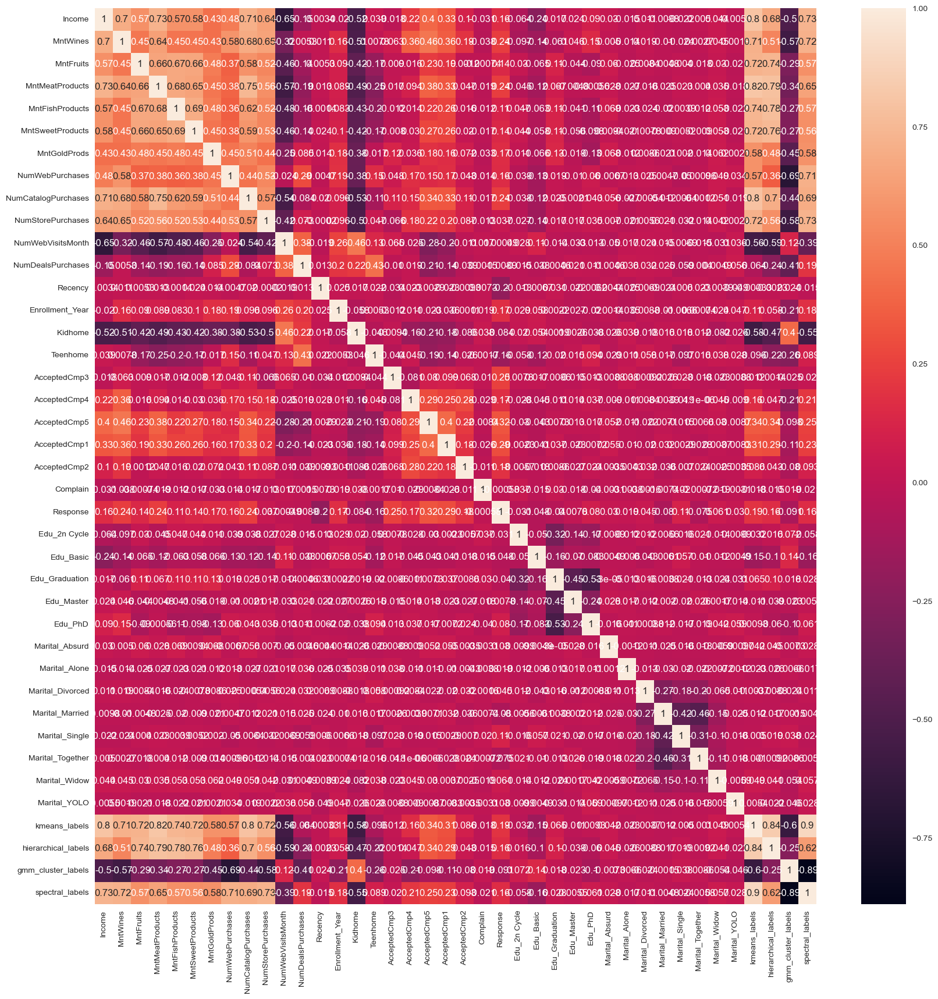

In [100]:
plt.figure(figsize=(20,20))
sns.heatmap(preprocessed_data.corr(), annot=True)
plt.show()

In [101]:
selected_columns =['Income', 'Spent', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'Enrollment_Year', 'Children', 'AcceptedCmp',
       'Age_Middle-Aged', 'Age_Young Adult', 'Education_Basic_Education',
       'Education_Higher_Education', 'Marital_Stat_Married',
       'Marital_Stat_Single', 'Marital_Stat_Together']
selected_df = data[selected_columns]
print(selected_df)

        Income      Spent  NumDealsPurchases  NumWebPurchases  \
0     0.285248  11.000290           0.501951         1.479459   
1    -0.275801  -4.780367          -0.147744        -1.157320   
2     0.926263   3.241944          -0.797440         1.479459   
3    -1.212850  -4.346458          -0.147744        -0.780637   
4     0.292621   0.129602           1.801342         0.349411   
...        ...        ...                ...              ...   
2233  3.116242  -3.941260           1.151647        -0.403955   
2235  0.432004   6.802189          -0.147744         1.856141   
2237  0.230208   2.429358          -0.797440        -0.780637   
2238  0.813616   3.065052          -0.147744         0.726093   
2239  0.034598  -3.801754           0.501951        -0.403955   

      NumCatalogPurchases  NumStorePurchases  NumWebVisitsMonth  \
0                2.703573          -0.546780           0.721693   
1               -0.593476          -1.164383          -0.127746   
2               -0

# KMEANS Correlation Data Set

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

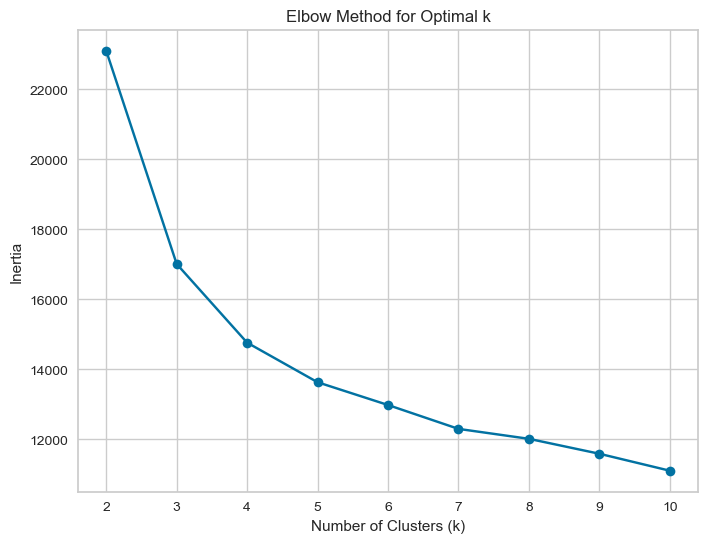

In [102]:
inertia_values = []

for k in range(2,11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=77, n_init='auto')
    kmeans.fit(selected_df)
    inertia_values.append(kmeans.inertia_)

plt.figure(figsize=(8, 6))
plt.plot(range(2,11), inertia_values, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()

In [103]:
kmeans = KMeans(n_clusters=3) 
kmeans.fit(selected_df) 
selected_df['kmeans_corr_labels'] = kmeans.labels_

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



In [104]:
silhouette_score = metrics.silhouette_score(selected_df, selected_df['kmeans_corr_labels']) 
calinski_harabasz_score = metrics.calinski_harabasz_score(selected_df, selected_df['kmeans_corr_labels']) 
davies_bouldin_index = metrics.davies_bouldin_score(selected_df, selected_df['kmeans_corr_labels']) 
print(f"Silhouette Score: {silhouette_score}") 
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}") 
print(f"Davies-Bouldin Index: {davies_bouldin_index}")

Silhouette Score: 0.41970521103997954
Calinski-Harabasz Index: 2959.7863803866053
Davies-Bouldin Index: 0.9670286168831139


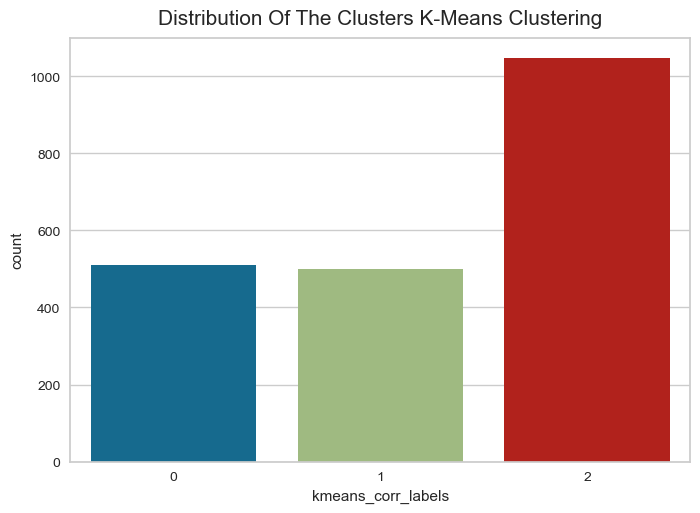

In [105]:
pl = sns.countplot(x=selected_df['kmeans_corr_labels'])
pl.set_title("Distribution Of The Clusters K-Means Clustering", pad=10, size = 15)
plt.show()

# HIERARCHICAL CLUSTERING Correlation Data Set

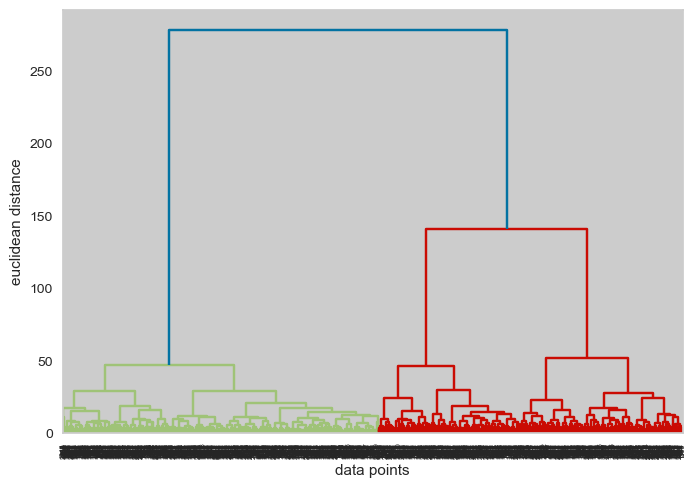

In [106]:
from scipy.cluster.hierarchy import linkage, dendrogram 
merg=linkage(selected_df,method="ward") 
dendrogram(merg,leaf_rotation=90) 
plt.xlabel("data points") 
plt.ylabel("euclidean distance")   
plt.show() 

In [107]:
hierarchical_cluster=AgglomerativeClustering(n_clusters=2,metric="euclidean",linkage="ward") 
cluster=hierarchical_cluster.fit_predict(selected_df) 
h_corr_labels = hierarchical_cluster.labels_ 
selected_df['hierarchical_corr_labels'] =h_corr_labels

In [108]:
silhouette_score = metrics.silhouette_score(selected_df, selected_df['hierarchical_corr_labels']) 
calinski_harabasz_score = metrics.calinski_harabasz_score(selected_df, selected_df['hierarchical_corr_labels']) 
davies_bouldin_index = metrics.davies_bouldin_score(selected_df, selected_df['hierarchical_corr_labels']) 
print(f"Silhouette Score: {silhouette_score}") 
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}") 
print(f"Davies-Bouldin Index: {davies_bouldin_index}") 

Silhouette Score: 0.4866458709039495
Calinski-Harabasz Index: 2964.5086457032
Davies-Bouldin Index: 0.7641924747580283


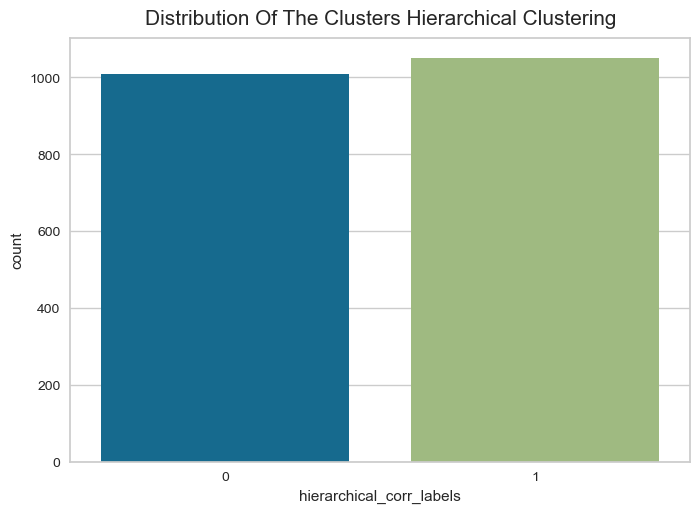

In [109]:
pl = sns.countplot(x=selected_df['hierarchical_corr_labels'])
pl.set_title("Distribution Of The Clusters Hierarchical Clustering", pad=10, size = 15)
plt.show()

# GMM Correlation Data Set

In [110]:
gmm = GaussianMixture(n_components=3) 
gmm.fit(selected_df) 
gmm_labels = gmm.predict(selected_df) 
selected_df["gmm_cluster_labels"]=gmm_labels 

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



In [111]:
silhouette_score = metrics.silhouette_score(selected_df, selected_df["gmm_cluster_labels"]) 
calinski_harabasz_score = metrics.calinski_harabasz_score(selected_df, selected_df["gmm_cluster_labels"]) 
davies_bouldin_index = metrics.davies_bouldin_score(selected_df, selected_df["gmm_cluster_labels"]) 
print(f"Silhouette Score: {silhouette_score}") 
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}") 
print(f"Davies-Bouldin Index: {davies_bouldin_index}")

Silhouette Score: 0.4390969320194761
Calinski-Harabasz Index: 3050.74534922371
Davies-Bouldin Index: 0.9286270809972402


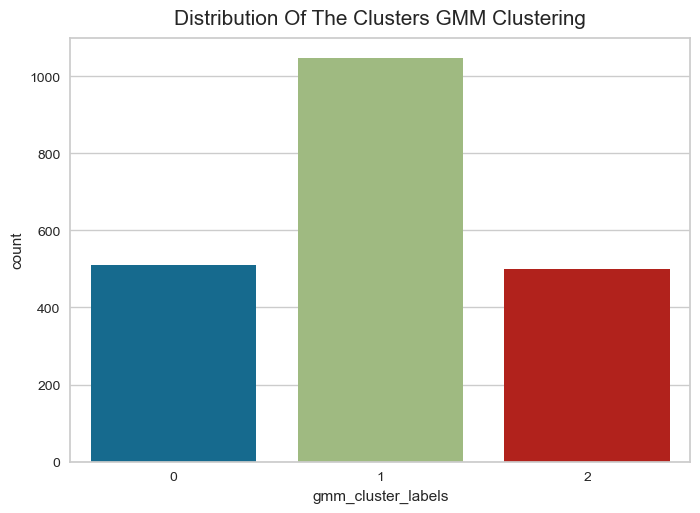

In [112]:
pl = sns.countplot(x=selected_df['gmm_cluster_labels'])
pl.set_title("Distribution Of The Clusters GMM Clustering", pad=10, size = 15)
plt.show()

# SPECTRAL CLUSTERING Correlation Data Set

In [113]:
spectral_model = SpectralClustering(n_clusters = 2, affinity ='nearest_neighbors') 
spectral_label = spectral_model.fit_predict(selected_df) 
selected_df["spectral_corr_labels"]=spectral_label

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



In [114]:
silhouette_score = metrics.silhouette_score(selected_df, selected_df["spectral_corr_labels"]) 
calinski_harabasz_score = metrics.calinski_harabasz_score(selected_df, selected_df["spectral_corr_labels"]) 
davies_bouldin_index = metrics.davies_bouldin_score(selected_df, selected_df["spectral_corr_labels"]) 
print(f"Silhouette Score: {silhouette_score}") 
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}") 
print(f"Davies-Bouldin Index: {davies_bouldin_index}") 

Silhouette Score: 0.5023222563344932
Calinski-Harabasz Index: 2621.633003584282
Davies-Bouldin Index: 0.6857037464796427


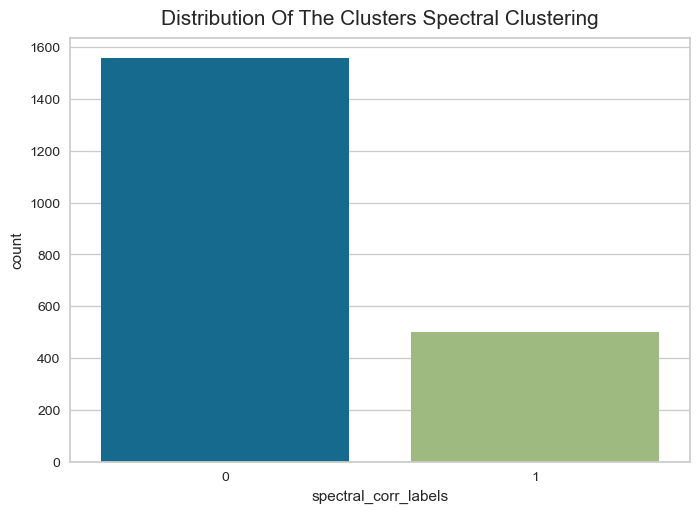

In [115]:
pl = sns.countplot(x=selected_df['spectral_corr_labels'])
pl.set_title("Distribution Of The Clusters Spectral Clustering", pad=10, size = 15)
plt.show()

# PCA

In [116]:
pca = PCA(n_components=3)
pca.fit(selected_df)
PCA_ds = pd.DataFrame(pca.transform(selected_df), columns=(["col1","col2", "col3"]))
PCA_ds.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,2058.0,-2.762071e-16,5.073245,-6.272985,-4.555745,-1.939572,4.217298,13.331150
col2,2058.0,-1.242932e-16,1.375222,-3.648580,-1.009840,-0.225329,0.871796,4.204314
col3,2058.0,-8.717786e-17,1.111345,-3.245170,-0.767387,-0.076605,0.694467,3.480351


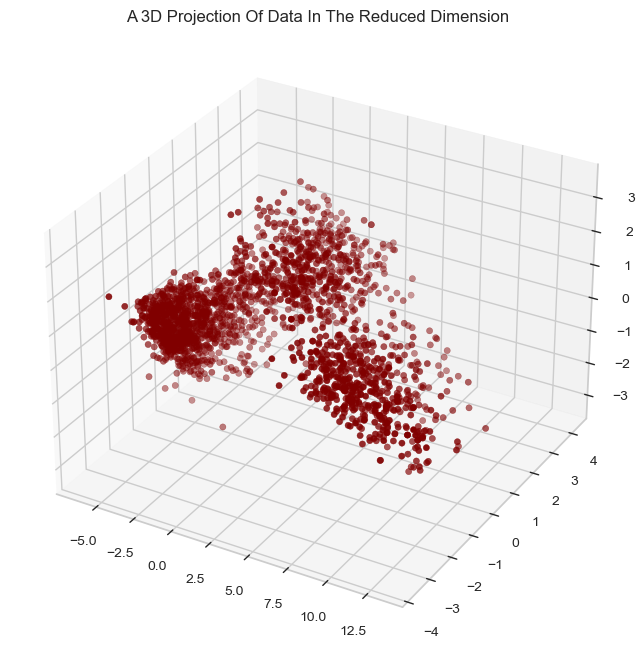

In [117]:
x=PCA_ds["col1"]
y=PCA_ds["col2"]
z=PCA_ds["col3"]


fig=plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

# HIERARCHICAL PCA Data

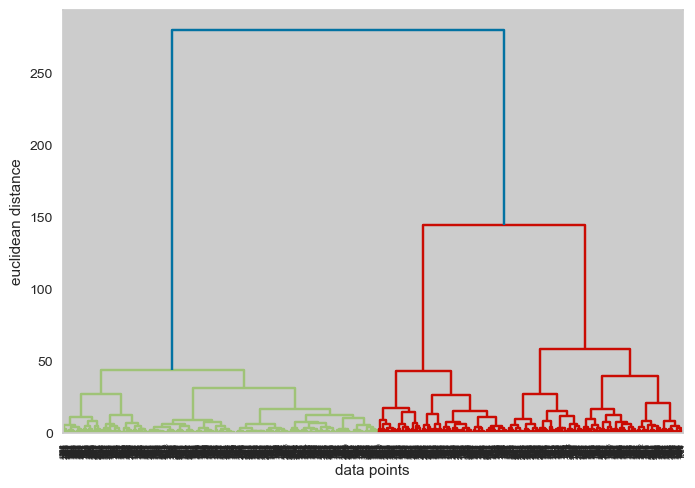

In [118]:
from scipy.cluster.hierarchy import linkage, dendrogram
merg=linkage(PCA_ds,method="ward")
dendrogram(merg,leaf_rotation=90)
plt.xlabel("data points")
plt.ylabel("euclidean distance")
plt.show()

In [119]:
hierarchical_cluster=AgglomerativeClustering(n_clusters=2,metric="euclidean",linkage="ward")
cluster=hierarchical_cluster.fit_predict(PCA_ds)
h_cluster_labels = hierarchical_cluster.labels_
data['hierarchical_cluster_labels'] = h_cluster_labels

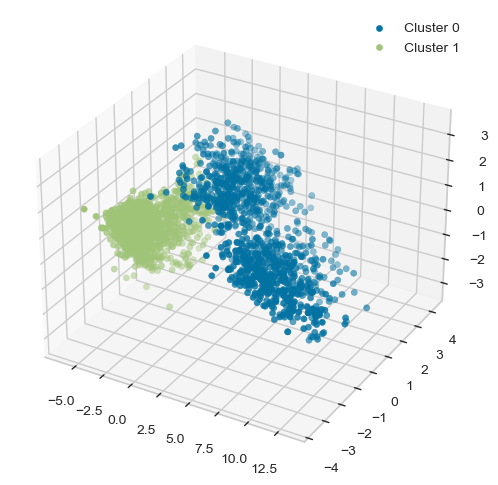

In [120]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
for i in range(2):
    cluster_data = PCA_ds[h_cluster_labels == i]
    ax.scatter(cluster_data['col1'], cluster_data['col2'], cluster_data['col3'], label=f'Cluster {i}')
ax.legend()
plt.show()

In [121]:
silhouette_score = metrics.silhouette_score(PCA_ds, data['hierarchical_cluster_labels'])
calinski_harabasz_score = metrics.calinski_harabasz_score(PCA_ds, data['hierarchical_cluster_labels'])
davies_bouldin_index = metrics.davies_bouldin_score(PCA_ds, data['hierarchical_cluster_labels'])
print(f"Silhouette Score: {silhouette_score}")
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}")
print(f"Davies-Bouldin Index: {davies_bouldin_index}")

Silhouette Score: 0.5711001947362222
Calinski-Harabasz Index: 4030.77958346739
Davies-Bouldin Index: 0.6052344734505609


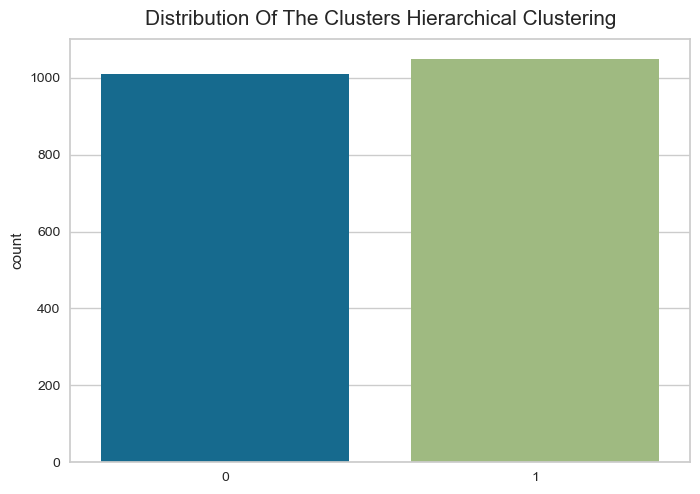

In [122]:
pl = sns.countplot(x=hierarchical_cluster.labels_)
pl.set_title("Distribution Of The Clusters Hierarchical Clustering", pad=10, size = 15)
plt.show()

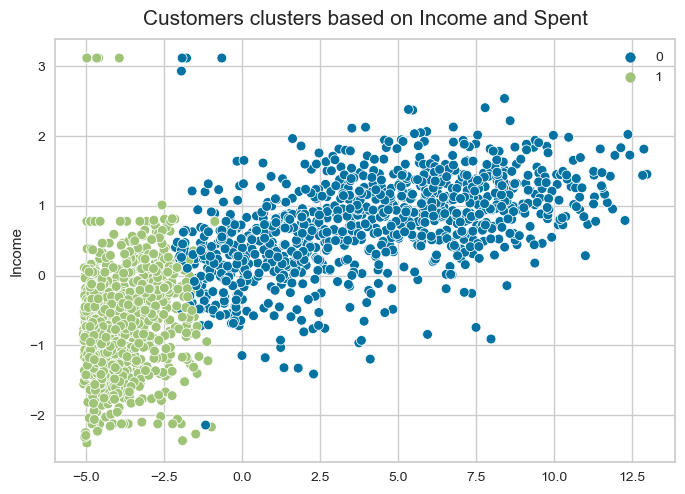

In [123]:
pl = sns.scatterplot(data = data, x = data['MntWines']+data['MntFruits']+data['MntMeatProducts']+
                     data['MntFishProducts']+data['MntSweetProducts']+data['MntGoldProds']
                     , y = selected_df['Income'], hue = hierarchical_cluster.labels_
                     , s=50)
pl.set_title('Customers clusters based on Income and Spent', pad=10, size=15)
plt.show()

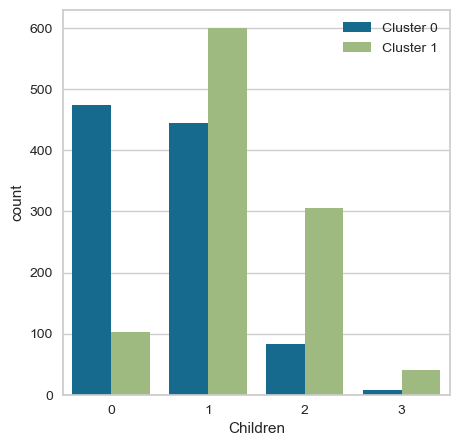

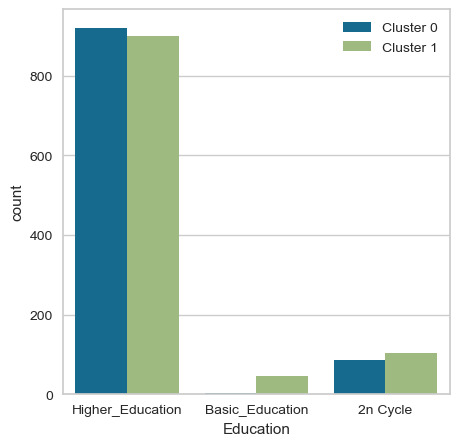

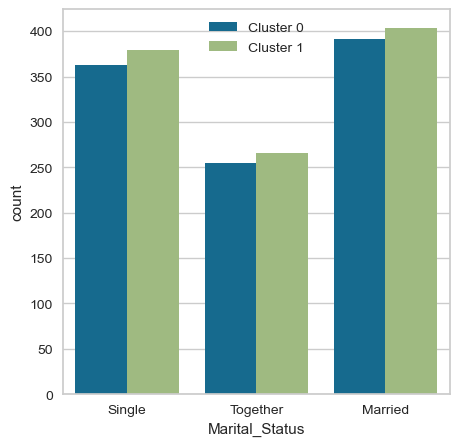

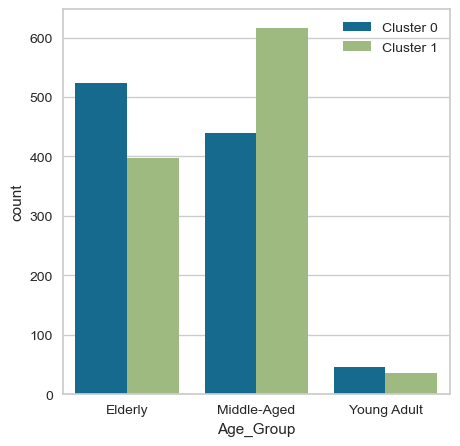

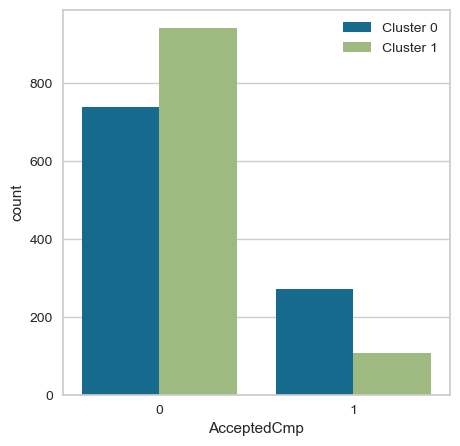

In [124]:
categoric = [ "Children","Education","Marital_Status","Age_Group","AcceptedCmp"]

for i in categoric:
            plt.figure(figsize=(5,5))
            sns.countplot(x=data[i], hue=data['hierarchical_cluster_labels'])
            plt.legend(['Cluster 0', 'Cluster 1', 'Cluster 2'])
            plt.show()



# K-MEAN PCA Data

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

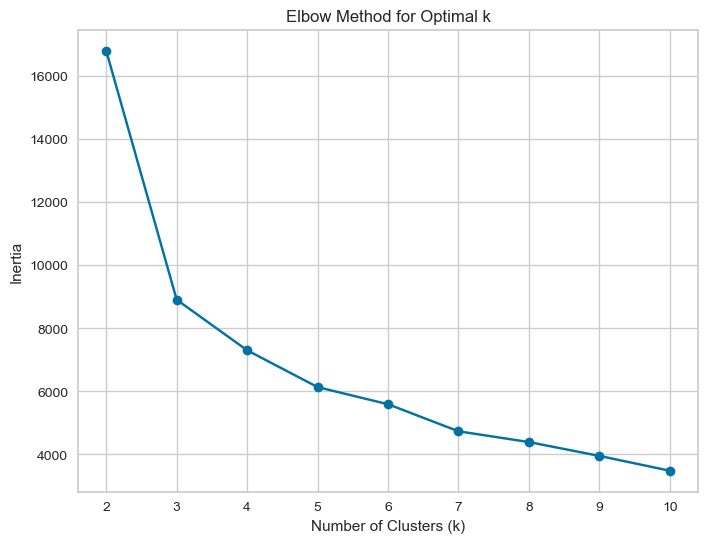

In [125]:
inertia_values = []

for k in range(2,11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=77, n_init='auto')
    kmeans.fit(PCA_ds)
    inertia_values.append(kmeans.inertia_)

plt.figure(figsize=(8, 6))
plt.plot(range(2,11), inertia_values, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()


In [126]:

kmeans = KMeans(n_clusters=3)
kmeans.fit(PCA_ds)

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



KMeans(n_clusters=3)

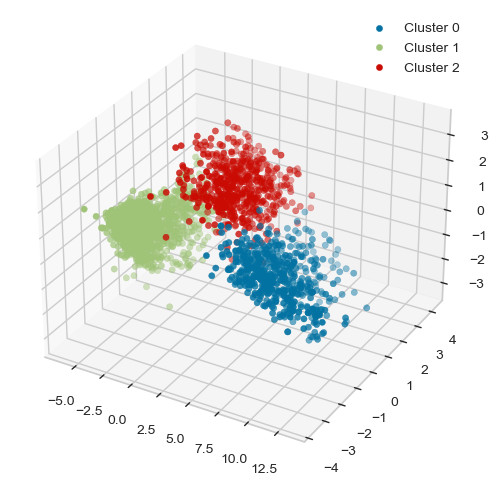

In [127]:
k_cluster_labels = kmeans.labels_
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
for i in range(3):
    cluster_data = PCA_ds[k_cluster_labels == i]
    ax.scatter(cluster_data['col1'], cluster_data['col2'], cluster_data['col3'], label=f'Cluster {i}')
ax.legend()
plt.show()

In [128]:
data['kmeans_cluster_labels'] = k_cluster_labels
print(data)

             Education Marital_Status    Income  Kidhome  Teenhome  \
0     Higher_Education         Single  0.285248        0         0   
1     Higher_Education         Single -0.275801        1         1   
2     Higher_Education       Together  0.926263        0         0   
3     Higher_Education       Together -1.212850        1         0   
4     Higher_Education        Married  0.292621        1         0   
...                ...            ...       ...      ...       ...   
2233  Higher_Education       Together  3.116242        1         0   
2235  Higher_Education        Married  0.432004        0         1   
2237  Higher_Education         Single  0.230208        0         0   
2238  Higher_Education       Together  0.813616        0         1   
2239  Higher_Education        Married  0.034598        1         1   

     Dt_Customer  MntWines  MntFruits  MntMeatProducts  MntFishProducts  ...  \
0     2012-09-04  1.004720   2.185418         2.216715         2.200534  ...   

In [129]:
silhouette_score = metrics.silhouette_score(PCA_ds, k_cluster_labels)
calinski_harabasz_score = metrics.calinski_harabasz_score(PCA_ds, k_cluster_labels)
davies_bouldin_index = metrics.davies_bouldin_score(PCA_ds, k_cluster_labels)
print(f"Silhouette Score: {silhouette_score}")
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}")
print(f"Davies-Bouldin Index: {davies_bouldin_index}")

Silhouette Score: 0.565662250309005
Calinski-Harabasz Index: 5821.061217442232
Davies-Bouldin Index: 0.657573988633288


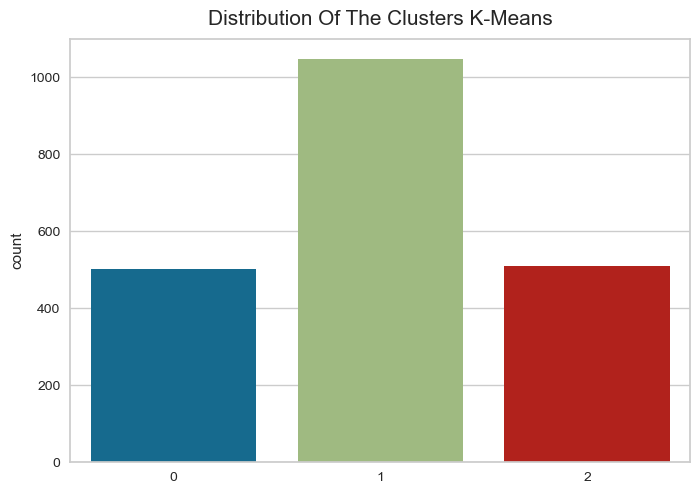

In [130]:
pl = sns.countplot(x=kmeans.labels_)
pl.set_title("Distribution Of The Clusters K-Means", pad=10, size = 15)
plt.show()

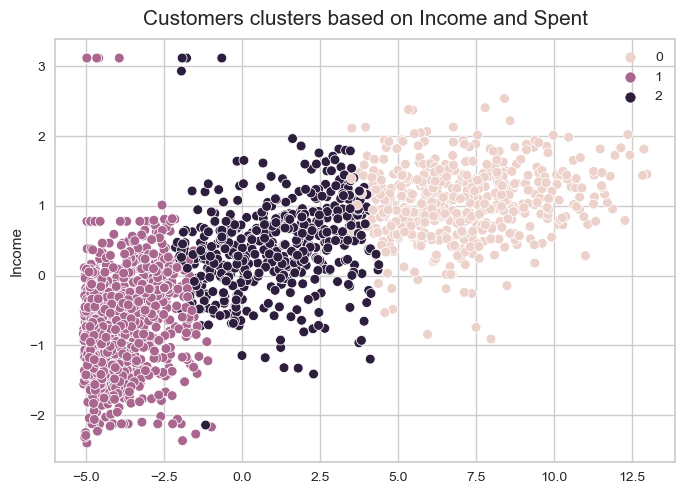

In [131]:
  pl = sns.scatterplot(data = data, x = data['MntWines']+data['MntFruits']+data['MntMeatProducts']+
                     data['MntFishProducts']+data['MntSweetProducts']+data['MntGoldProds']
                     , y = selected_df['Income'], hue = kmeans.labels_
                     , s=50)
pl.set_title('Customers clusters based on Income and Spent', pad=10, size=15)
plt.show()

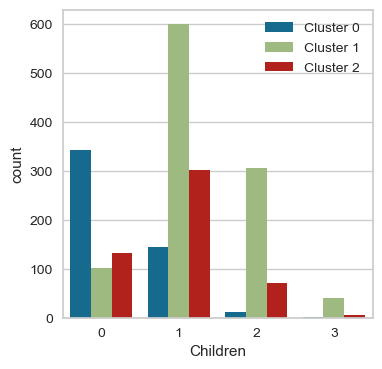

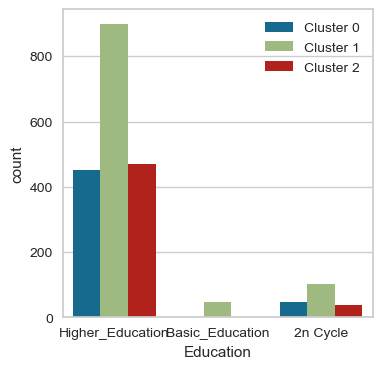

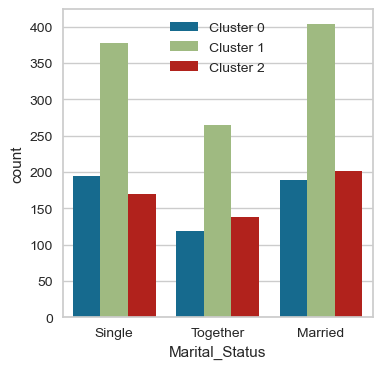

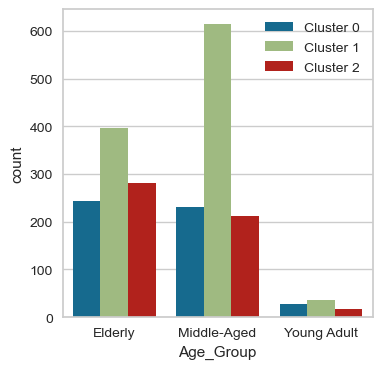

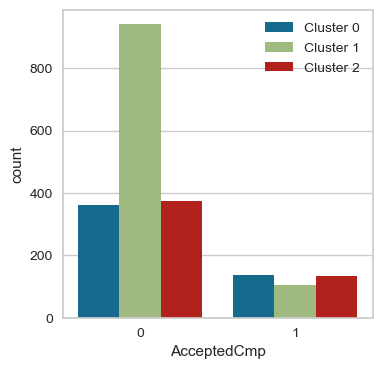

In [132]:
categoric = [ "Children","Education","Marital_Status","Age_Group","AcceptedCmp"]

for i in categoric:
            plt.figure(figsize=(4,4))
            sns.countplot(x=data[i], hue=data['kmeans_cluster_labels'])
            plt.legend(['Cluster 0', 'Cluster 1', 'Cluster 2','Cluster 3','Cluster 4'])
            plt.show()


# GMM PCA Data

In [133]:
gmm = GaussianMixture(n_components=3)
gmm.fit(PCA_ds)
gmm_labels = gmm.predict(PCA_ds)

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



In [134]:
data["gmm_cluster_labels"]=gmm_labels
print(data)

             Education Marital_Status    Income  Kidhome  Teenhome  \
0     Higher_Education         Single  0.285248        0         0   
1     Higher_Education         Single -0.275801        1         1   
2     Higher_Education       Together  0.926263        0         0   
3     Higher_Education       Together -1.212850        1         0   
4     Higher_Education        Married  0.292621        1         0   
...                ...            ...       ...      ...       ...   
2233  Higher_Education       Together  3.116242        1         0   
2235  Higher_Education        Married  0.432004        0         1   
2237  Higher_Education         Single  0.230208        0         0   
2238  Higher_Education       Together  0.813616        0         1   
2239  Higher_Education        Married  0.034598        1         1   

     Dt_Customer  MntWines  MntFruits  MntMeatProducts  MntFishProducts  ...  \
0     2012-09-04  1.004720   2.185418         2.216715         2.200534  ...   

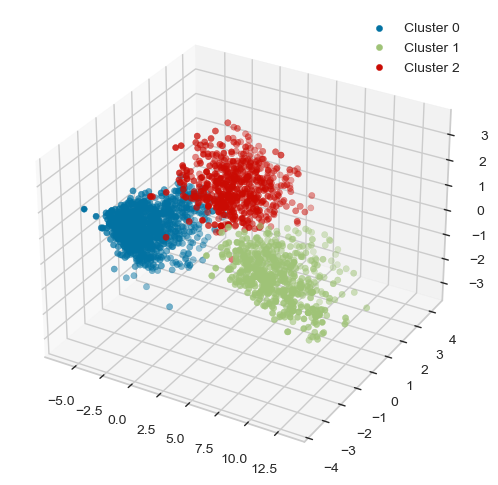

In [135]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
for i in range(3):
    cluster_data = PCA_ds[gmm_labels == i]
    ax.scatter(cluster_data['col1'], cluster_data['col2'], cluster_data['col3'], label=f'Cluster {i}')
ax.legend()
plt.show()

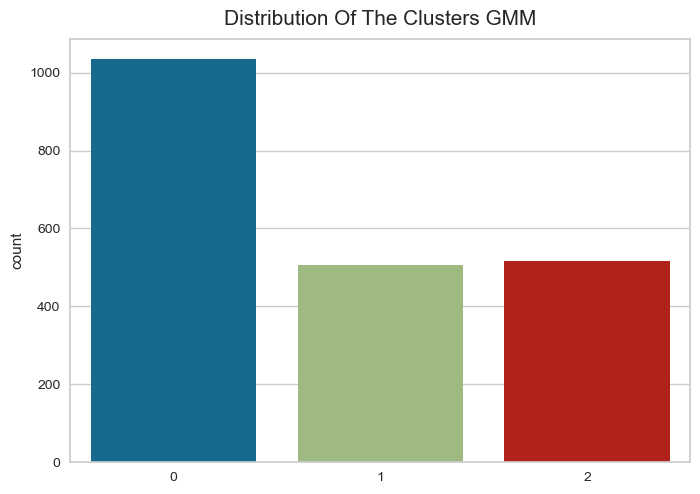

In [136]:
pl = sns.countplot(x=gmm_labels)
pl.set_title("Distribution Of The Clusters GMM", pad=10, size = 15)
plt.show()

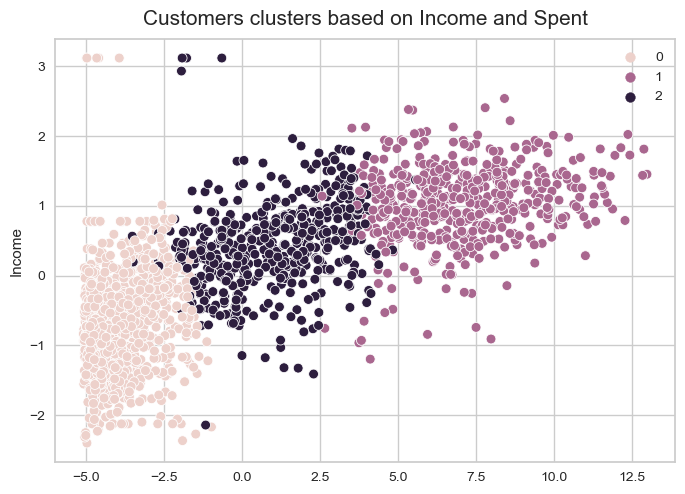

In [137]:
  pl = sns.scatterplot(data = data, x = data['MntWines']+data['MntFruits']+data['MntMeatProducts']+
                     data['MntFishProducts']+data['MntSweetProducts']+data['MntGoldProds']
                     , y = selected_df['Income'], hue = gmm_labels
                     , s=50)
pl.set_title('Customers clusters based on Income and Spent', pad=10, size=15)
plt.show()

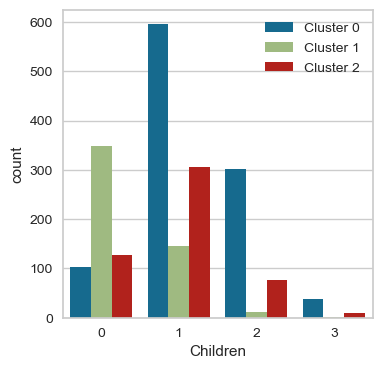

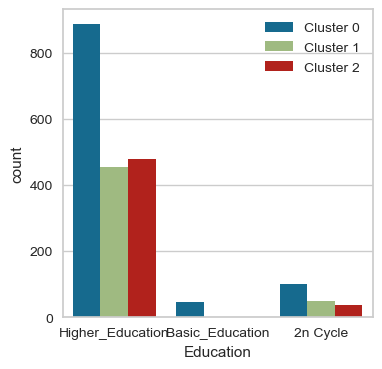

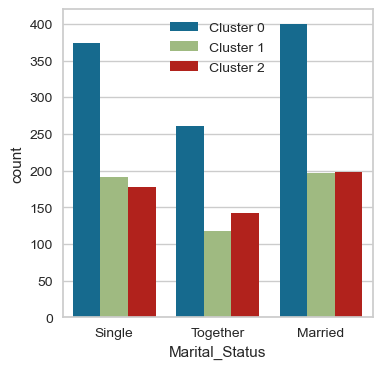

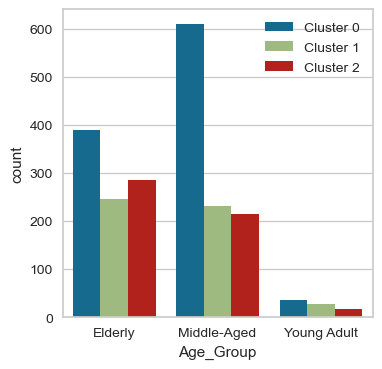

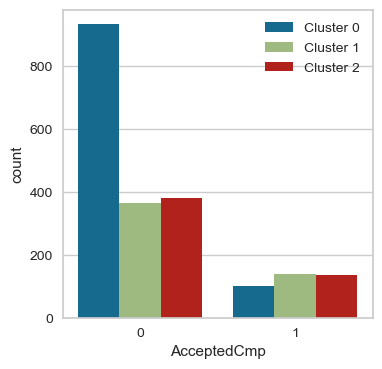

In [138]:
categoric = [ "Children","Education","Marital_Status","Age_Group","AcceptedCmp"]

for i in categoric:
            plt.figure(figsize=(4,4))
            sns.countplot(x=data[i], hue=data['gmm_cluster_labels'])
            plt.legend(['Cluster 0', 'Cluster 1','Cluster 2'])
            plt.show()

In [139]:
silhouette_score = metrics.silhouette_score(PCA_ds, gmm_labels)
calinski_harabasz_score = metrics.calinski_harabasz_score(PCA_ds, gmm_labels)
davies_bouldin_index = metrics.davies_bouldin_score(PCA_ds, gmm_labels)
print(f"Silhouette Score: {silhouette_score}")
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}")
print(f"Davies-Bouldin Index: {davies_bouldin_index}")

Silhouette Score: 0.5581653188580008
Calinski-Harabasz Index: 5638.588477772139
Davies-Bouldin Index: 0.666165122097372


# SPECTRAL CLUSTERING PCA Data

In [140]:
spectral_model = SpectralClustering(n_clusters = 2, affinity ='nearest_neighbors') 
spectral_label = spectral_model.fit_predict(PCA_ds) 

C:\Users\semih\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



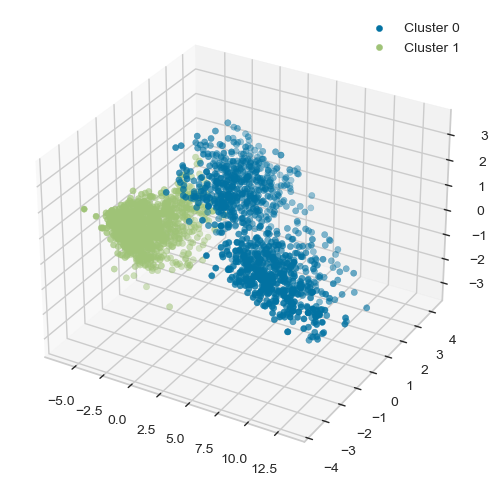

In [141]:
fig = plt.figure(figsize=(8, 6)) 
ax = fig.add_subplot(111, projection='3d') 
for i in range(2): 
    cluster_data = PCA_ds[ spectral_label == i] 
    ax.scatter(cluster_data['col1'], cluster_data['col2'], cluster_data['col3'], label=f'Cluster {i}') 
ax.legend() 
plt.show()

In [142]:
silhouette_score = metrics.silhouette_score(PCA_ds, spectral_label) 
calinski_harabasz_score = metrics.calinski_harabasz_score(PCA_ds, spectral_label) 
davies_bouldin_index = metrics.davies_bouldin_score(PCA_ds, spectral_label) 
print(f"Silhouette Score: {silhouette_score}") 
print(f"Calinski-Harabasz Index: {calinski_harabasz_score}") 
print(f"Davies-Bouldin Index: {davies_bouldin_index}") 

Silhouette Score: 0.5710248727423166
Calinski-Harabasz Index: 4030.44361830106
Davies-Bouldin Index: 0.6052968166396906


In [143]:
data["spectral_cluster_labels"]=spectral_label
print(data)

             Education Marital_Status    Income  Kidhome  Teenhome  \
0     Higher_Education         Single  0.285248        0         0   
1     Higher_Education         Single -0.275801        1         1   
2     Higher_Education       Together  0.926263        0         0   
3     Higher_Education       Together -1.212850        1         0   
4     Higher_Education        Married  0.292621        1         0   
...                ...            ...       ...      ...       ...   
2233  Higher_Education       Together  3.116242        1         0   
2235  Higher_Education        Married  0.432004        0         1   
2237  Higher_Education         Single  0.230208        0         0   
2238  Higher_Education       Together  0.813616        0         1   
2239  Higher_Education        Married  0.034598        1         1   

     Dt_Customer  MntWines  MntFruits  MntMeatProducts  MntFishProducts  ...  \
0     2012-09-04  1.004720   2.185418         2.216715         2.200534  ...   

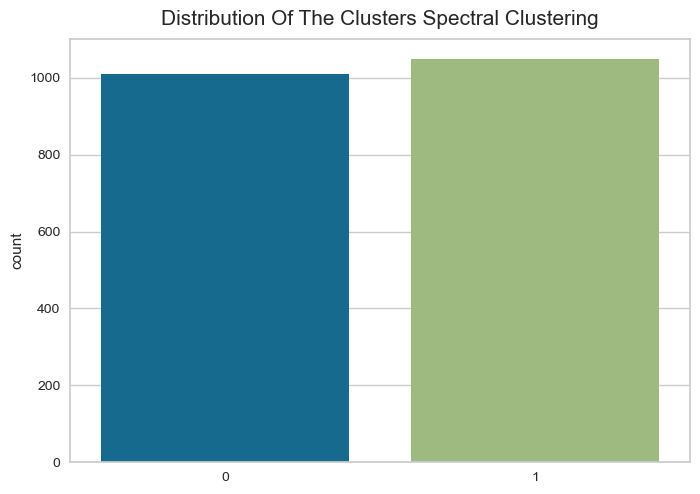

In [145]:
pl = sns.countplot(x=spectral_label)
pl.set_title("Distribution Of The Clusters Spectral Clustering", pad=10, size = 15)
plt.show()

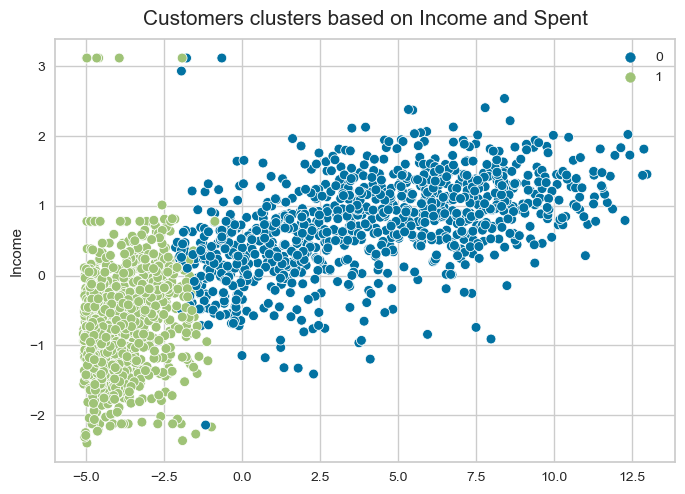

In [146]:
  pl = sns.scatterplot(data = data, x = data['MntWines']+data['MntFruits']+data['MntMeatProducts']+
                     data['MntFishProducts']+data['MntSweetProducts']+data['MntGoldProds']
                     , y = selected_df['Income'], hue = spectral_label
                     , s=50)
pl.set_title('Customers clusters based on Income and Spent', pad=10, size=15)
plt.show()

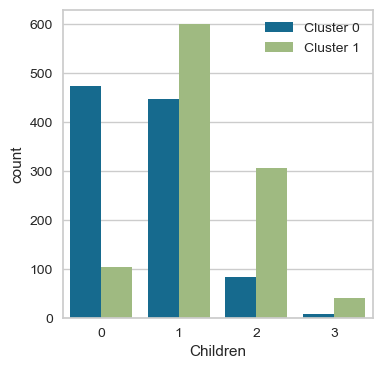

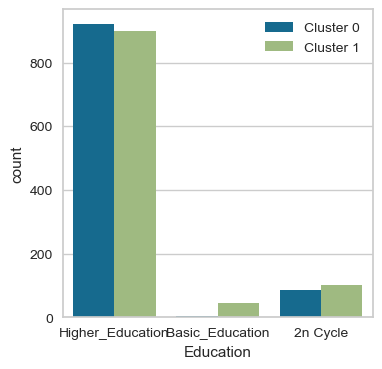

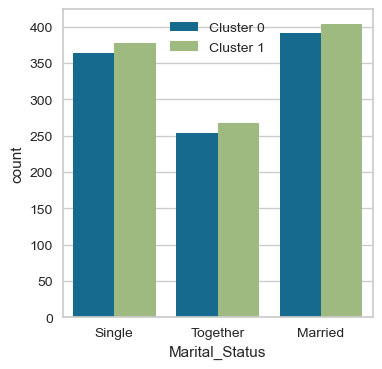

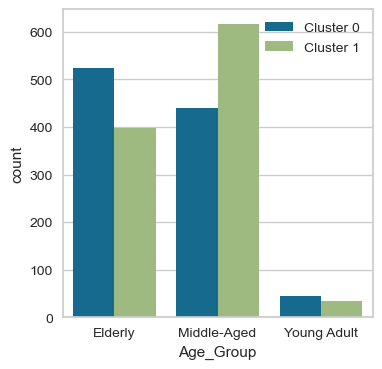

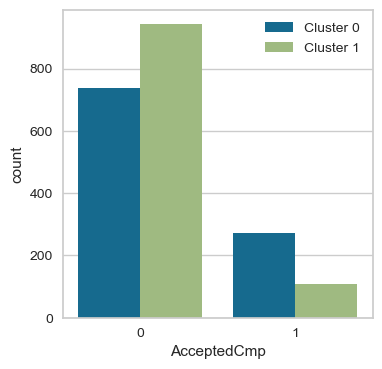

In [147]:
categoric = [ "Children","Education","Marital_Status","Age_Group","AcceptedCmp"]

for i in categoric:
            plt.figure(figsize=(4,4))
            sns.countplot(x=data[i], hue=data["spectral_cluster_labels"])
            plt.legend(['Cluster 0', 'Cluster 1','Cluster 2'])
            plt.show()

# ANALYSIS OF SEGMENTS